<a href="https://colab.research.google.com/github/AndreMouraL/Atividade-02-engenharia-de-controle-andre-moura-lima/blob/main/Atividade_02_engenharia_de_controle_andre_moura_lima.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

ATIVIDADE 02 - ANDRE MOURA LIMA

**B.3.4**

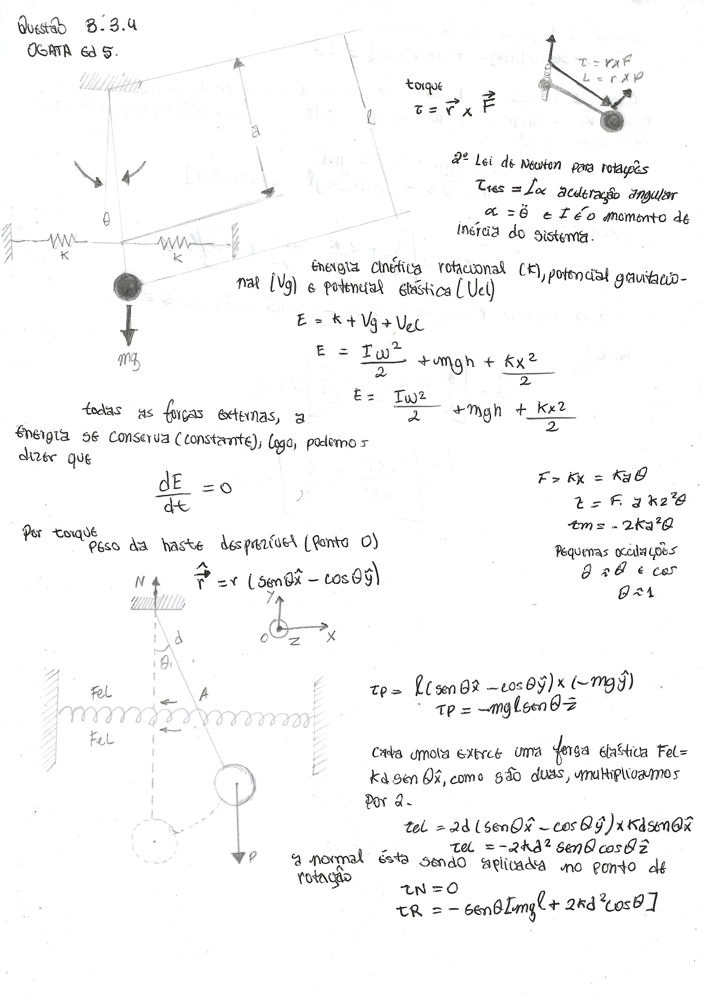

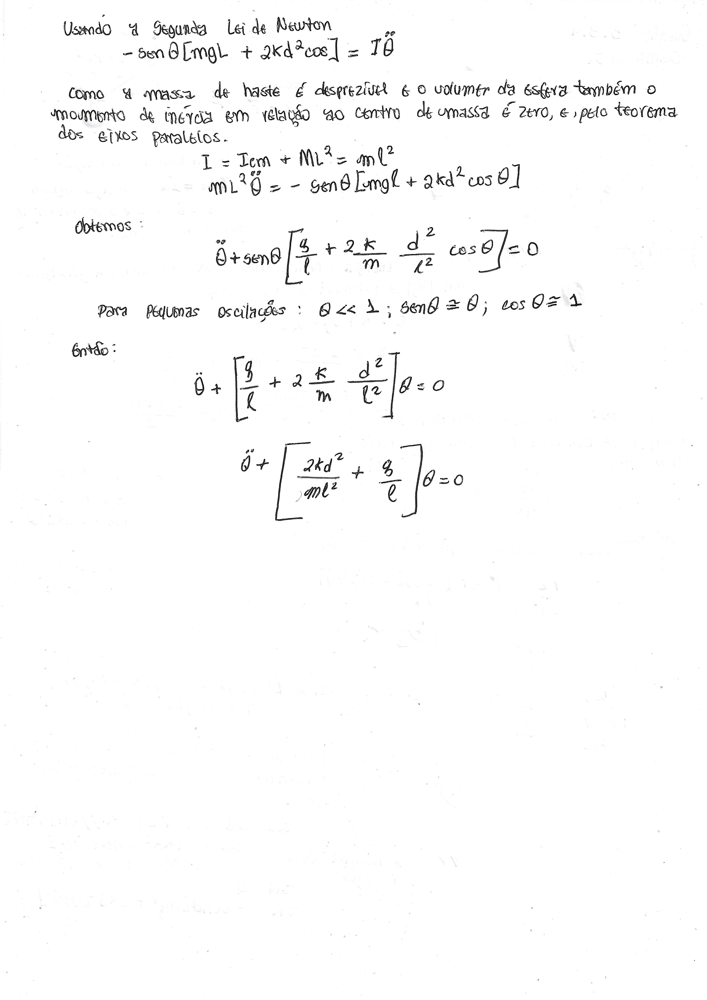

1. Importações e Definições Iniciais

In [ ]:
import sympy as sp

# Variáveis simbólicas
t = sp.symbols('t')                     # tempo
theta = sp.Function('theta')(t)         # θ(t)
g, l, k, m, d = sp.symbols('g l k m d')  # constantes físicas

# Derivadas de theta
theta_dot = sp.diff(theta, t)
theta_ddot = sp.diff(theta, t, t)


2. Equação do Torque Total

τ
R
​
 =−sin(θ)(mgl+2kd^2
 cosθ)

In [ ]:
# Torque resultante (projetado no eixo de rotação z)
tau_r = -sp.sin(theta) * (m * g * l + 2 * k * d**2 * sp.cos(theta))


Como a haste é desprezível e o sistema é uma esfera girando em torno de um ponto:
I=ml^2

Segunda Lei de Newton para rotações
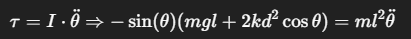

In [ ]:
# Momento de inércia
I = m * l**2

# Equação de movimento rotacional
eq = sp.Eq(I * theta_ddot, tau_r)


Linearização (Pequenas Oscilações)


In [ ]:
# Aproximações para pequenas oscilações
approx_eq = eq.subs({
    sp.sin(theta): theta,
    sp.cos(theta): 1
}).doit()

# Resolver isolando θ''(t)
theta_ddot_expr = sp.solve(approx_eq, theta_ddot)[0]
theta_ddot_expr


(-2*d**2*k - g*l*m)*theta(t)/(l**2*m)

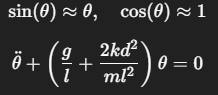

In [ ]:
# Constante da equação
omega_squared = (g / l) + (2 * k * d**2) / (m * l**2)

# Forma final da EDO
final_eq = sp.Eq(sp.diff(theta, t, t) + omega_squared * theta, 0)
final_eq


Eq((2*d**2*k/(l**2*m) + g/l)*theta(t) + Derivative(theta(t), (t, 2)), 0)

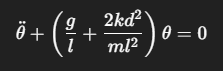

REPRESENTAÇÃO DE ESPAÇO DE ESTADOS

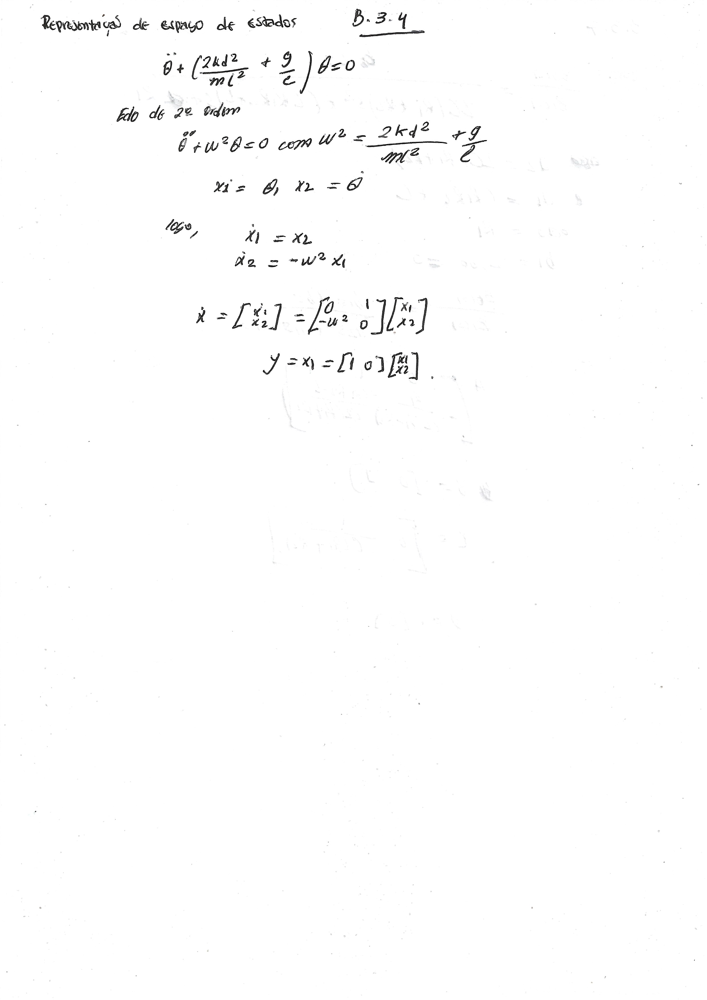

Código Python para Espaço de Estados

In [ ]:
import sympy as sp

# Constantes simbólicas
g, l, k, m, d = sp.symbols('g l k m d')

# Estados
x1, x2 = sp.symbols('x1 x2')  # x1 = θ, x2 = θ'

# Derivadas dos estados
x1_dot = x2
omega_squared = (g / l) + (2 * k * d**2) / (m * l**2)
x2_dot = -omega_squared * x1


Forma Vetorial da Representação



In [ ]:
# Vetor de estado
X = sp.Matrix([x1, x2])

# Matriz A (dinâmica do sistema)
A = sp.Matrix([
    [0, 1],
    [-omega_squared, 0]
])

# Sem entrada (sistema autônomo)
B = sp.Matrix([
    [0],
    [0]
])

# Saída é a posição angular θ (x1)
C = sp.Matrix([[1, 0]])

# Sem entrada
D = sp.Matrix([[0]])


In [ ]:
A, B, C, D


(Matrix([
 [                       0, 1],
 [-2*d**2*k/(l**2*m) - g/l, 0]]),
 Matrix([
 [0],
 [0]]),
 Matrix([[1, 0]]),
 Matrix([[0]]))

Gráficos

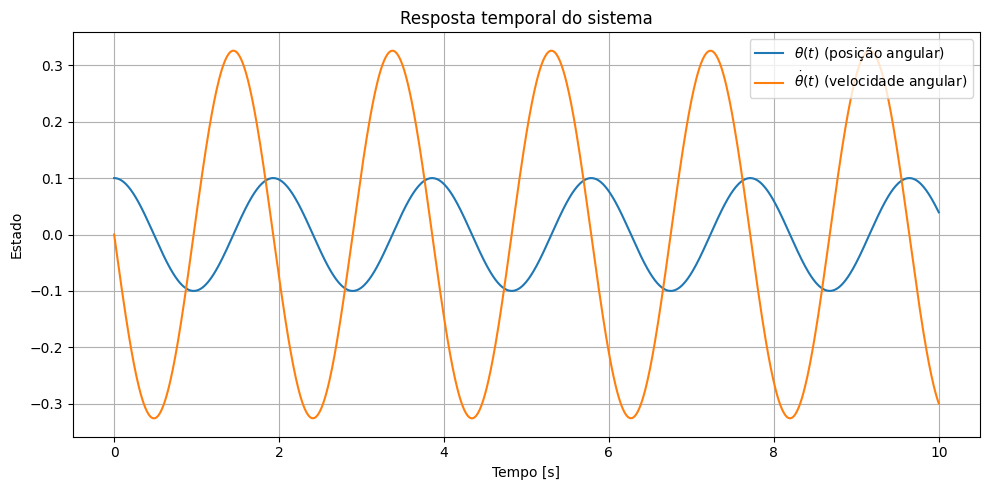

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp

# Parâmetros do sistema
g = 9.81        # gravidade [m/s²]
k = 10.0        # constante da mola [N/m]
m = 1.0         # massa [kg]
l = 1.0         # comprimento [m]
d = 0.2         # deslocamento das molas [m]

# Frequência natural ao quadrado
omega_squared = (2 * k * d**2) / (m * l**2) + (g / l)

# Função do sistema em forma de espaço de estados
def pendulo_molas(t, x):
    x1, x2 = x
    dx1dt = x2
    dx2dt = -omega_squared * x1
    return [dx1dt, dx2dt]

# Condições iniciais
theta0 = 0.1  # radianos
dtheta0 = 0.0 # velocidade angular inicial

# Intervalo de tempo
t_span = (0, 10)
t_eval = np.linspace(t_span[0], t_span[1], 1000)

# Resolver EDO
sol = solve_ivp(pendulo_molas, t_span, [theta0, dtheta0], t_eval=t_eval)

# Plotar resultado
plt.figure(figsize=(10,5))
plt.plot(sol.t, sol.y[0], label=r'$\theta(t)$ (posição angular)')
plt.plot(sol.t, sol.y[1], label=r'$\dot{\theta}(t)$ (velocidade angular)')
plt.xlabel('Tempo [s]')
plt.ylabel('Estado')
plt.title('Resposta temporal do sistema')
plt.legend()
plt.grid()
plt.tight_layout()
plt.show()


**B.3.6**

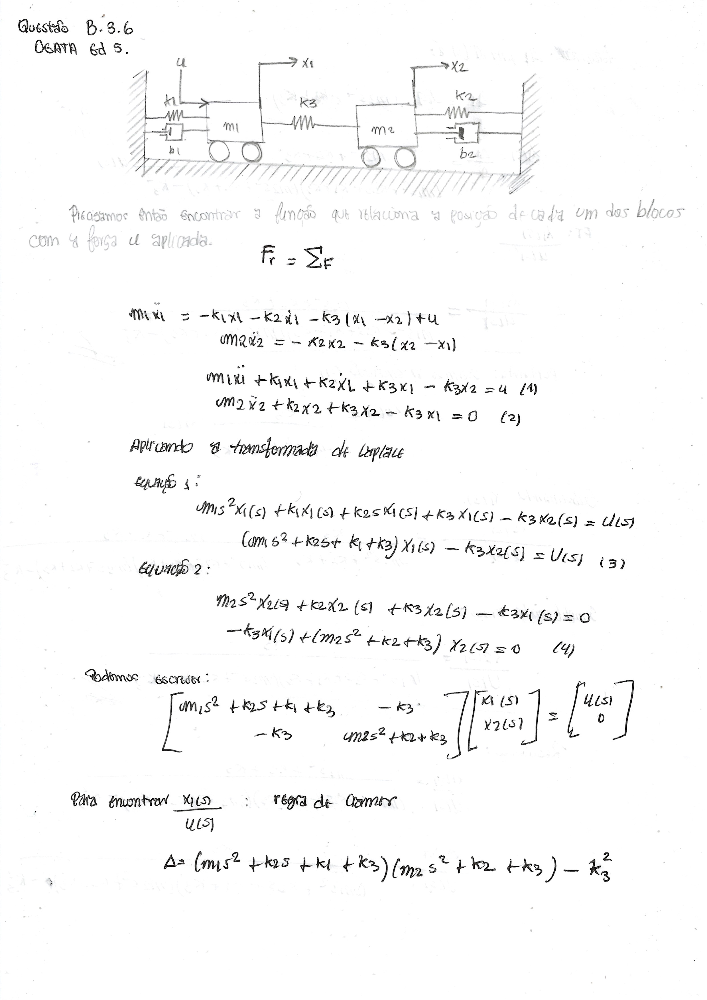

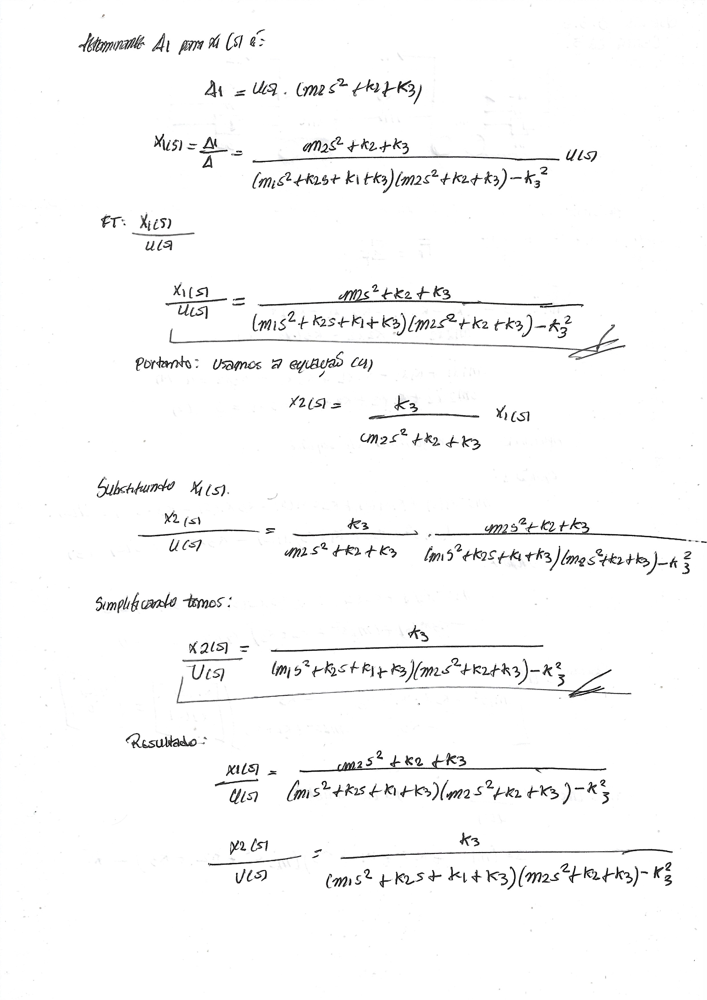

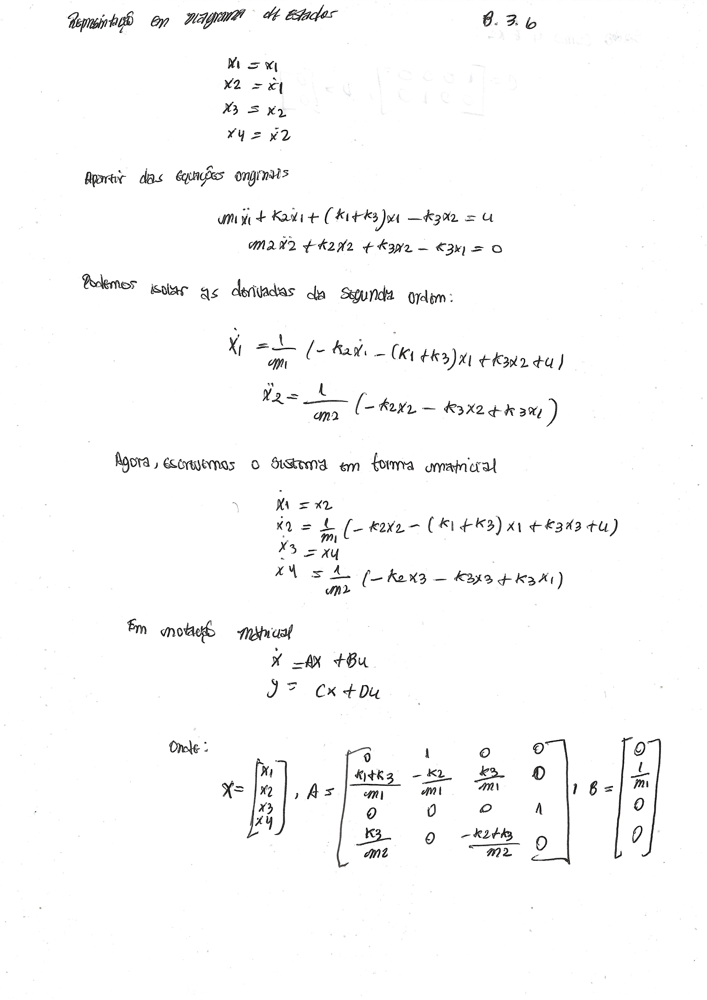

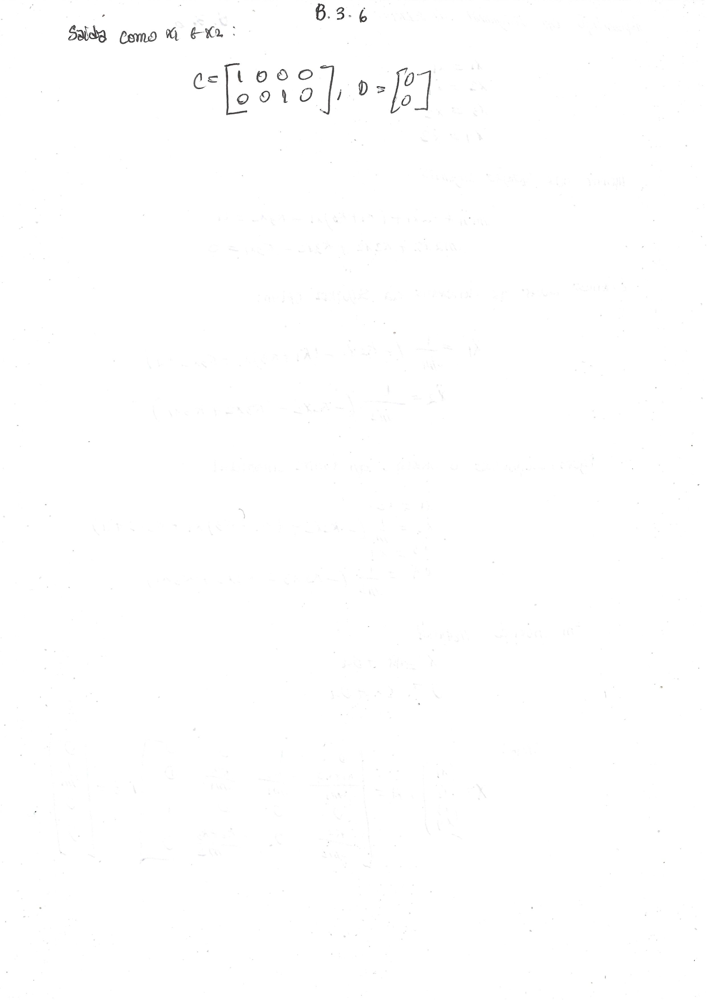

In [ ]:
!pip install control

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.6/549.6 kB 9.3 MB/s eta 0:00:00


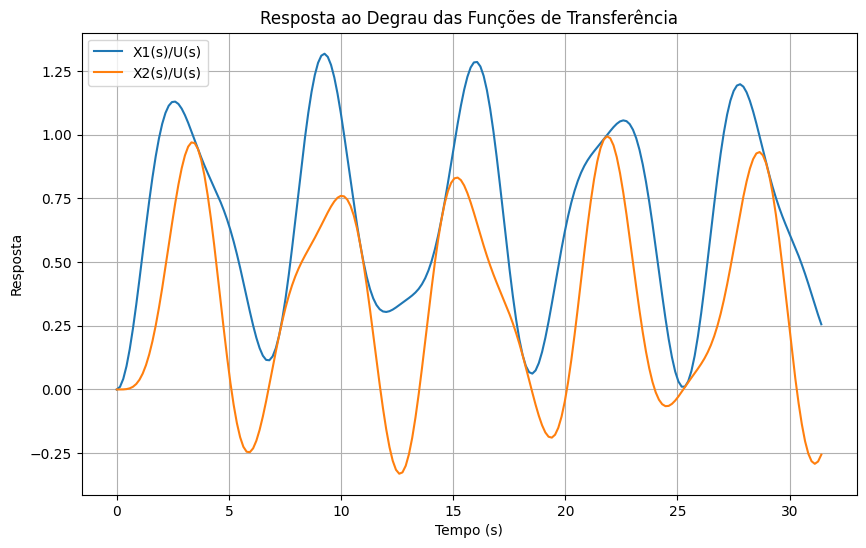

In [ ]:
import numpy as np
import control as ct
import matplotlib.pyplot as plt

# Parâmetros do sistema (substitua pelos valores reais)
m1, m2 = 1.0, 1.0
k1, k2, k3 = 1.0, 1.0, 1.0

# Numeradores e denominadores das funções de transferência
num_X1 = [m2, 0, k2 + k3]
den_X1 = [
    m1 * m2,
    0,
    m1 * (k2 + k3) + m2 * (k1 + k3),
    0,
    (k1 + k3) * (k2 + k3) - k3**2
]

num_X2 = [k3]
den_X2 = den_X1  # mesmo denominador

# Criar sistemas
sys_X1 = ct.TransferFunction(num_X1, den_X1)
sys_X2 = ct.TransferFunction(num_X2, den_X2)

# Resposta ao degrau
t, y_X1 = ct.step_response(sys_X1)
t, y_X2 = ct.step_response(sys_X2)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(t, y_X1, label='X1(s)/U(s)')
plt.plot(t, y_X2, label='X2(s)/U(s)')
plt.xlabel('Tempo (s)')
plt.ylabel('Resposta')
plt.title('Resposta ao Degrau das Funções de Transferência')
plt.legend()
plt.grid()
plt.show()

**B.4.2**

In [ ]:
import numpy as np
import control as ct
from sympy import symbols

# Parâmetros do sistema como símbolos
m1, m2 = symbols('m1 m2')
k1, k2, k3 = symbols('k1 k2 k3')
s = symbols('s')  # Variável complexa da transformada de Laplace

# Funções de Transferência
print("\n--- Funções de Transferência ---")
print(f"X1(s)/U(s) =")
print(f"({m2}*s^2 + {k2} + {k3}) / [({m1}*s^2 + {k2}*s + {k1} + {k3})*({m2}*s^2 + {k2} + {k3}) - {k3}^2]")

print(f"\nX2(s)/U(s) =")
print(f"{k3} / [({m1}*s^2 + {k2}*s + {k1} + {k3})*({m2}*s^2 + {k2} + {k3}) - {k3}^2]")

# Espaço de Estado
print("\n--- Representação em Espaço de Estado ---")
print("Matriz A:")
print(f"[[0, 1, 0, 0]")
print(f" [{-(k1 + k3)/m1}, {-k2/m1}, {k3/m1}, 0]")
print(f" [0, 0, 0, 1]")
print(f" [{k3/m2}, 0, {-(k2 + k3)/m2}, 0]]")

print("\nMatriz B:")
print(f"[[0]")
print(f" [{1/m1}]")
print(f" [0]")
print(f" [0]]")

print("\nMatriz C:")
print("[[1, 0, 0, 0]")
print(" [0, 0, 1, 0]]")

print("\nMatriz D:")
print("[[0]")
print(" [0]]")


--- Funções de Transferência ---
X1(s)/U(s) =
(m2*s^2 + k2 + k3) / [(m1*s^2 + k2*s + k1 + k3)*(m2*s^2 + k2 + k3) - k3^2]

X2(s)/U(s) =
k3 / [(m1*s^2 + k2*s + k1 + k3)*(m2*s^2 + k2 + k3) - k3^2]

--- Representação em Espaço de Estado ---
Matriz A:
[[0, 1, 0, 0]
 [(-k1 - k3)/m1, -k2/m1, k3/m1, 0]
 [0, 0, 0, 1]
 [k3/m2, 0, (-k2 - k3)/m2, 0]]

Matriz B:
[[0]
 [1/m1]
 [0]
 [0]]

Matriz C:
[[1, 0, 0, 0]
 [0, 0, 1, 0]]

Matriz D:
[[0]
 [0]]


Logo

In [ ]:
import numpy as np
import control as ct

# Parâmetros do sistema
m1, m2 = 1.0, 1.0
k1, k2, k3 = 1.0, 1.0, 1.0

# Funções de Transferência
print("\n--- Funções de Transferência ---")
num_X1 = [m2, 0, k2 + k3]
den_X1 = [m1*m2, 0, m1*(k2 + k3) + m2*(k1 + k3), 0, (k1 + k3)*(k2 + k3) - k3**2]
sys_X1 = ct.TransferFunction(num_X1, den_X1)
print(f"X1(s)/U(s) = \n{sys_X1}\n")

num_X2 = [k3]
den_X2 = den_X1  # mesmo denominador
sys_X2 = ct.TransferFunction(num_X2, den_X2)
print(f"X2(s)/U(s) = \n{sys_X2}\n")

# Espaço de Estado
print("\n--- Representação em Espaço de Estado ---")
A = np.array([
    [0, 1, 0, 0],
    [-(k1 + k3)/m1, -k2/m1, k3/m1, 0],
    [0, 0, 0, 1],
    [k3/m2, 0, -(k2 + k3)/m2, 0]
])
B = np.array([[0], [1/m1], [0], [0]])
C = np.array([[1, 0, 0, 0], [0, 0, 1, 0]])
D = np.array([[0], [0]])

sys_ss = ct.ss(A, B, C, D)
print("Matriz A:\n", A)
print("\nMatriz B:\n", B)
print("\nMatriz C:\n", C)
print("\nMatriz D:\n", D)


--- Funções de Transferência ---
X1(s)/U(s) = 
<TransferFunction>: sys[9]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


    s^2 + 2
---------------
s^4 + 4 s^2 + 3


X2(s)/U(s) = 
<TransferFunction>: sys[10]
Inputs (1): ['u[0]']
Outputs (1): ['y[0]']


       1
---------------
s^4 + 4 s^2 + 3



--- Representação em Espaço de Estado ---
Matriz A:
 [[ 0.  1.  0.  0.]
 [-2. -1.  1.  0.]
 [ 0.  0.  0.  1.]
 [ 1.  0. -2.  0.]]

Matriz B:
 [[0.]
 [1.]
 [0.]
 [0.]]

Matriz C:
 [[1 0 0 0]
 [0 0 1 0]]

Matriz D:
 [[0]
 [0]]


**B.3.7**

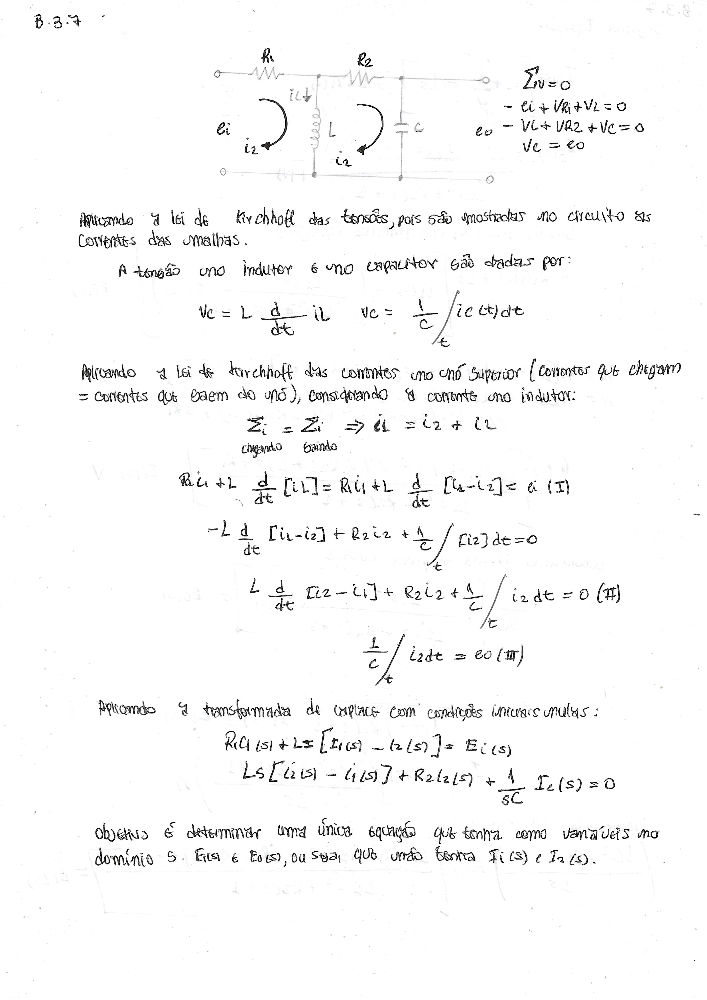

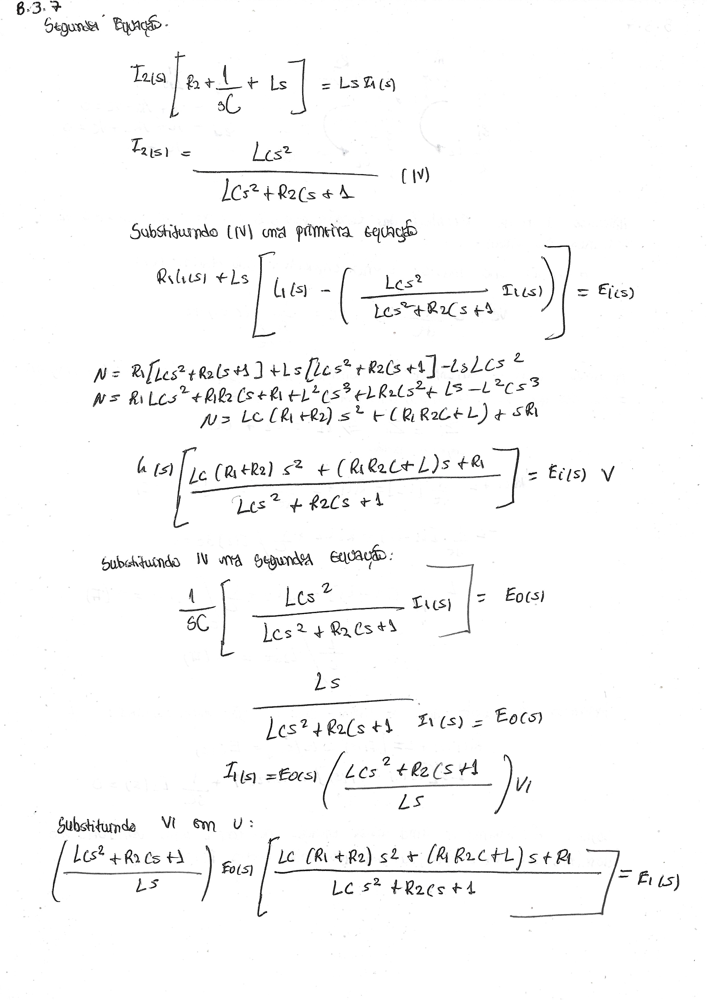

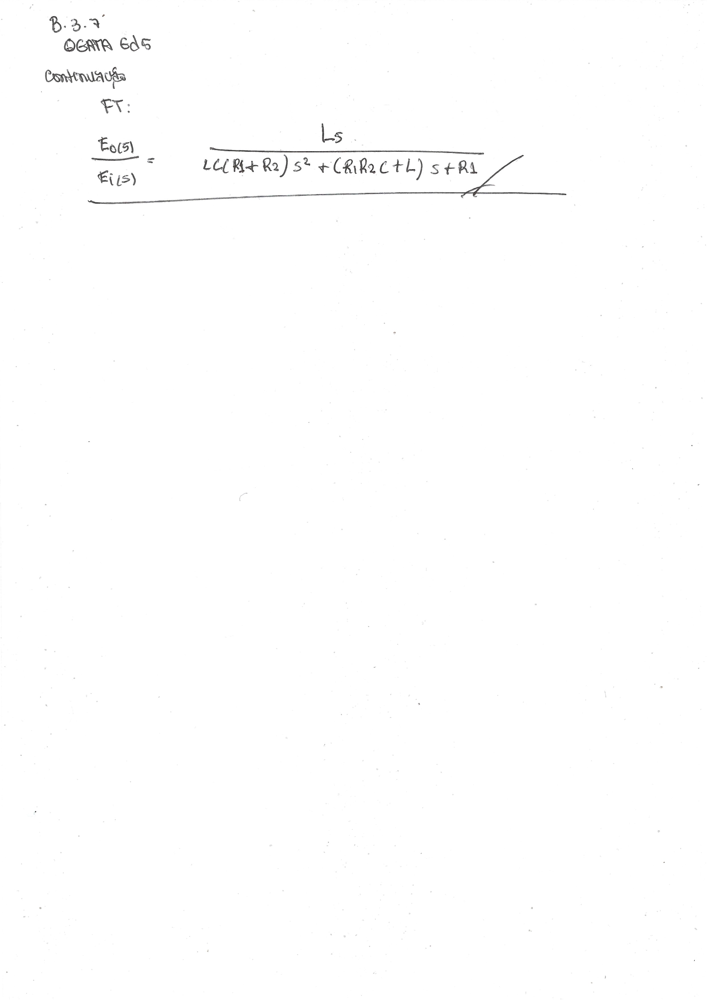

In [ ]:
import sympy as sp

# Variáveis simbólicas
s = sp.symbols('s')
R1, R2, L, C = sp.symbols('R1 R2 L C')
Ei = sp.Function('Ei')(s)
Eo = sp.Function('Eo')(s)
I1 = sp.Function('I1')(s)
I2 = sp.Function('I2')(s)


Equações do Circuito no Domínio de Laplace:

In [ ]:
# Primeira equação (malha 1)
eq1 = sp.Eq(R1 * I1 + L * s * (I1 - I2), Ei)

# Segunda equação (malha 2)
eq2 = sp.Eq(L * s * (I2 - I1) + R2 * I2 + (1 / (s * C)) * I2, 0)


Resolvendo o sistema para I1(s) e I2(s)

In [ ]:
sol = sp.solve((eq1, eq2), (I1, I2), dict=True)[0]
I1_sol = sol[I1]
I2_sol = sol[I2]


Expressão para
𝐸
𝑜
(
𝑠
)
=
1
𝑠
𝐶
⋅
𝐼
2
(
𝑠
)
Eo(s)=
sC
1
​
 ⋅I2(s)

In [ ]:
Eo_expr = (1 / (s * C)) * I2_sol




Função de Transferência:



In [ ]:
FT = sp.simplify(Eo_expr / Ei)
FT


L*s/(C*L*R1*s**2 + C*L*R2*s**2 + C*R1*R2*s + L*s + R1)

OU:

In [ ]:
import sympy as sp

# Definindo as variáveis simbólicas
s = sp.symbols('s')
R1, R2, L, C = sp.symbols('R1 R2 L C')

# Numerador: Ls
numerador = L * s

# Denominador: LC(R1 + R2)s^2 + (CR1R2 + L)s + R1
denominador = L*C*(R1 + R2)*s**2 + (C*R1*R2 + L)*s + R1

# Função de transferência
G = numerador / denominador

# Simplificar (opcional, mas ajuda)
G_simplificada = sp.simplify(G)

# Exibir
sp.pretty_print(G_simplificada)


                  L⋅s                  
───────────────────────────────────────
     2                                 
C⋅L⋅s ⋅(R₁ + R₂) + R₁ + s⋅(C⋅R₁⋅R₂ + L)


Espaço de estado

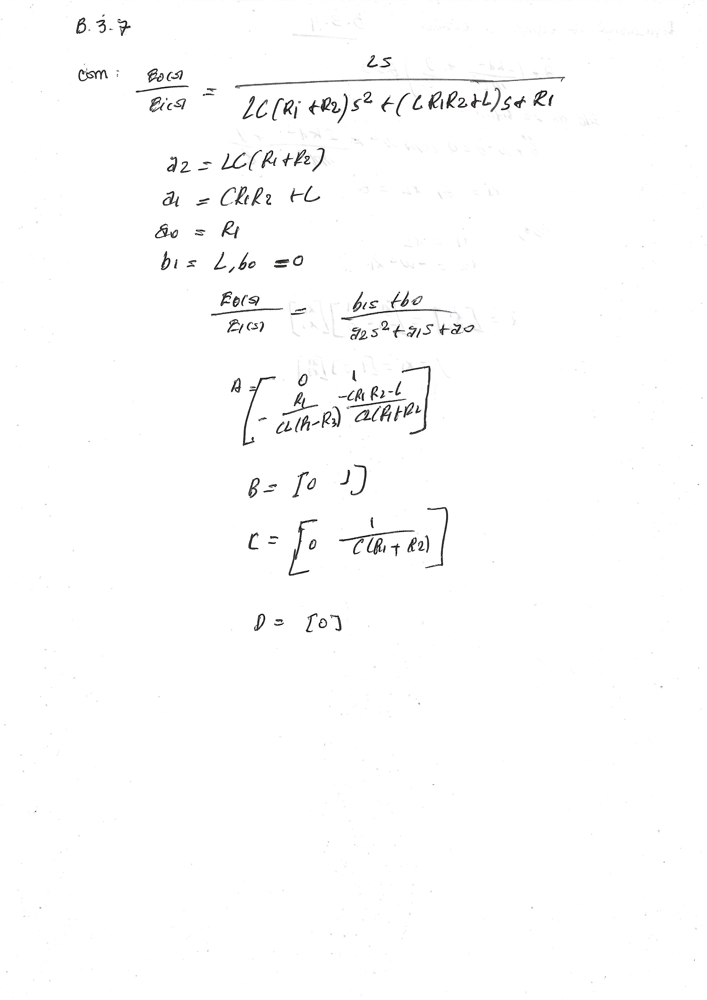

In [ ]:
import sympy as sp
from sympy import symbols, Matrix, init_printing, simplify

# Inicializar impressão bonita
init_printing()

# Definição das variáveis simbólicas
s = sp.symbols('s')
R1, R2, L, C = sp.symbols('R1 R2 L C')

# Coeficientes do denominador e numerador da função de transferência
a2 = L * C * (R1 + R2)
a1 = C * R1 * R2 + L
a0 = R1  # Corrigido aqui

b1 = L
b0 = 0

# Construção das matrizes do espaço de estado (forma canônica controlável)
A = Matrix([
    [0, 1],
    [-a0/a2, -a1/a2]
])

B = Matrix([
    [0],
    [1]
])

C_matrix = Matrix([
    [b0/a2, (b1 - b0 * a1/a2)/a2]
])

D = Matrix([
    [0]
])

# Exibição das matrizes
print("Matriz A:")
display(A)

print("Matriz B:")
display(B)

print("Matriz C:")
display(C_matrix)

print("Matriz D:")
display(D)


Matriz A:


⎡      0              1      ⎤
⎢                            ⎥
⎢    -R₁        -C⋅R₁⋅R₂ - L ⎥
⎢─────────────  ─────────────⎥
⎣C⋅L⋅(R₁ + R₂)  C⋅L⋅(R₁ + R₂)⎦

Matriz B:


⎡0⎤
⎢ ⎥
⎣1⎦

Matriz C:


⎡        1     ⎤
⎢0  ───────────⎥
⎣   C⋅(R₁ + R₂)⎦

Matriz D:


[0]

**B.3.10**

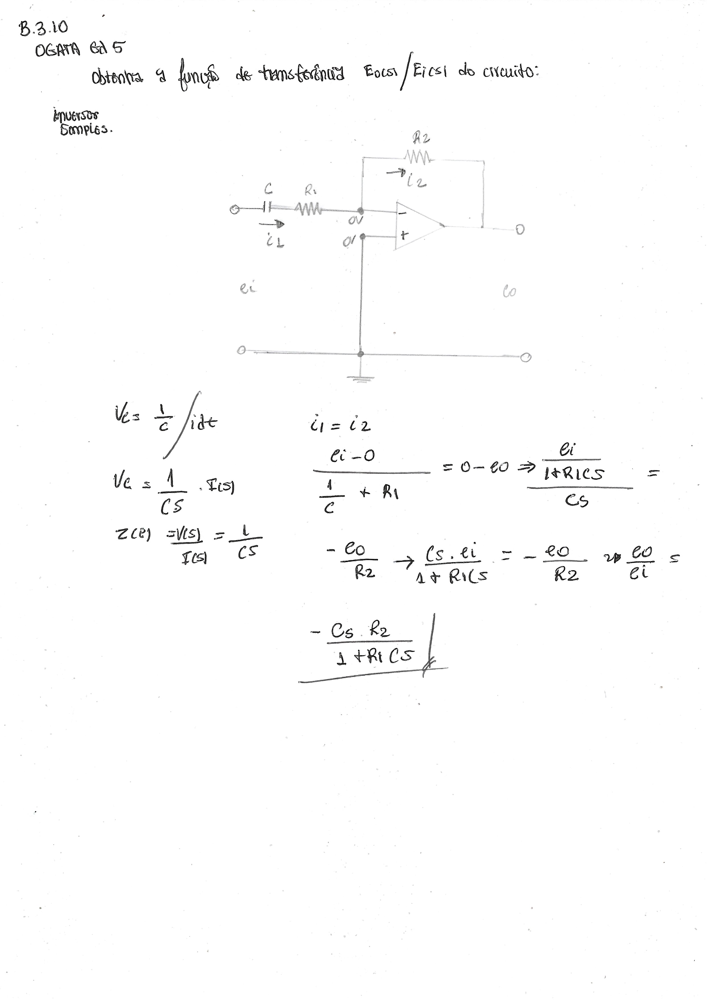

In [ ]:
from sympy import symbols, Function, Eq, simplify

# Definindo variáveis simbólicas
s, C, R1, R2, Ei, Eo = symbols('s C R1 R2 Ei Eo')

# Impedância do capacitor no domínio de Laplace
Zc = 1 / (C * s)

# Corrente i passando por R1 e o capacitor
# Pela malha de entrada: (Ei - 0) / (R1 + 1/(Cs)) = i
# Logo: i = Ei / (R1 + 1/(C*s)) = (C*s*Ei) / (1 + R1*C*s)
i = (C * s * Ei) / (1 + R1 * C * s)

# Corrente i2 na realimentação pela malha de saída: i2 = -Eo / R2
# Como i = i2 (pela corrente no nó do inversor do op-amp), temos:
# (C*s*Ei) / (1 + R1*C*s) = -Eo / R2

# Isolando Eo / Ei:
#Eo_Ei = simplify(- (C * s * R2) / (1 + R1 * C * s))

#print("Função de transferência Eo(s)/Ei(s):")
#print(f"Eo(s)/Ei(s) = {Eo_Ei}")


In [ ]:
import sympy as sp

# Define símbolos
s, C, R1, R2 = sp.symbols('s C R1 R2')

# Define numerador e denominador simbolicamente
numerador = -C * s * R2
denominador = 1 + R1 * C * s

# Calcula a função de transferência
G = numerador / denominador

# Constrói a saída manualmente, usando substituição simbólica para o formato desejado
# Converte partes da função em string no formato que você quer (Cs·R2, R1Cs, etc.)
numerador_str = "-Cs·R₂"
denominador_str = "1 + R₁Cs"
linha = "-" * max(len(numerador_str), len(denominador_str)) * 2  # para centralizar melhor

# Imprime resultado no estilo desejado
print("\nFunção de Transferência Eo(s)/Ei(s):\n")
print(f"         {numerador_str}")
print(f"     {linha}")
print(f"        {denominador_str}")



Função de Transferência Eo(s)/Ei(s):

         -Cs·R₂
     ----------------
        1 + R₁Cs


ESPAÇO DE ESTADO

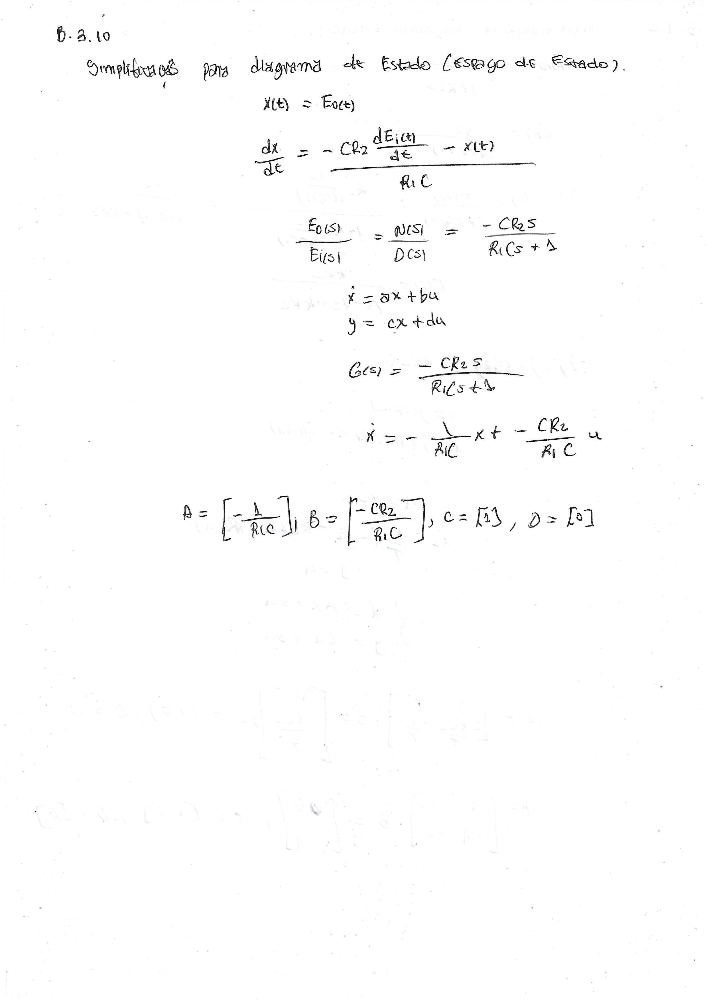

In [ ]:
import sympy as sp

# Define símbolos
R1, R2, C = sp.symbols('R1 R2 C')

# Matrizes do sistema
A = sp.Matrix([[-1 / (R1 * C)]])
B = sp.Matrix([[-C * R2 / (R1 * C)]])
C_mat = sp.Matrix([[1]])
D = sp.Matrix([[0]])

# Impressão das matrizes
print("\nRepresentação em Espaço de Estado:\n")
print("A =")
sp.pprint(A)
print("\nB =")
sp.pprint(B)
print("\nC =")
sp.pprint(C_mat)
print("\nD =")
sp.pprint(D)



Representação em Espaço de Estado:

A =
⎡-1  ⎤
⎢────⎥
⎣C⋅R₁⎦

B =
⎡-R₂ ⎤
⎢────⎥
⎣ R₁ ⎦

C =
[1]

D =
[0]


**B.4.2**

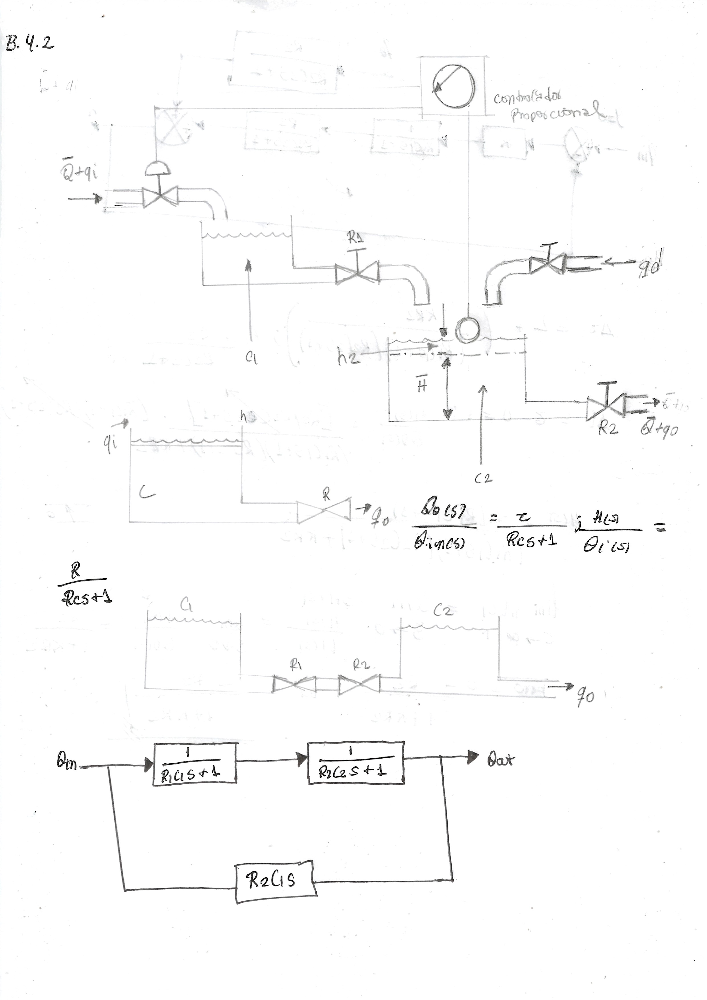

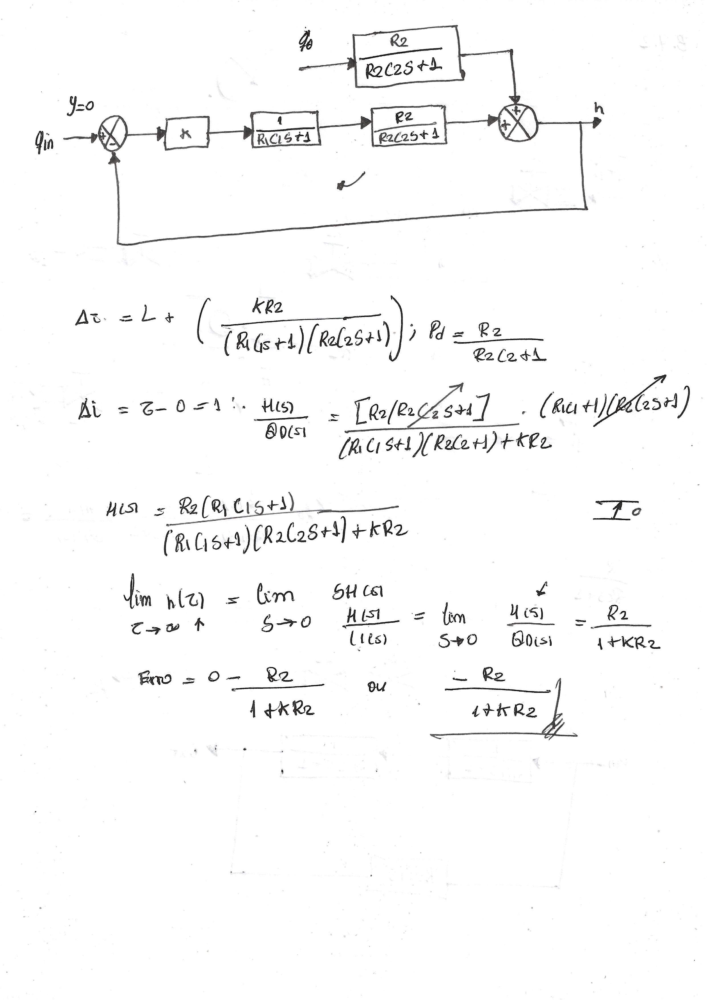

In [ ]:
import sympy as sp

# Definir variáveis simbólicas
s = sp.symbols('s')
R1, R2, C1, C2, K = sp.symbols('R1 R2 C1 C2 K')

# H(s) = [R2(R1C1s + 1)] / [(R1C1s + 1)(R2C2s + 1) + KR2]
numerador = R2 * (R1 * C1 * s + 1)
denominador = (R1 * C1 * s + 1) * (R2 * C2 * s + 1) + K * R2
H_s = numerador / denominador

# Erro final: 0 - lim_{s -> 0} H(s)
lim_h = sp.limit(H_s, s, 0)
erro_final = -lim_h.simplify()

print("Erro final =", erro_final)


Erro final = -R2/(K*R2 + 1)


Espaço de estados

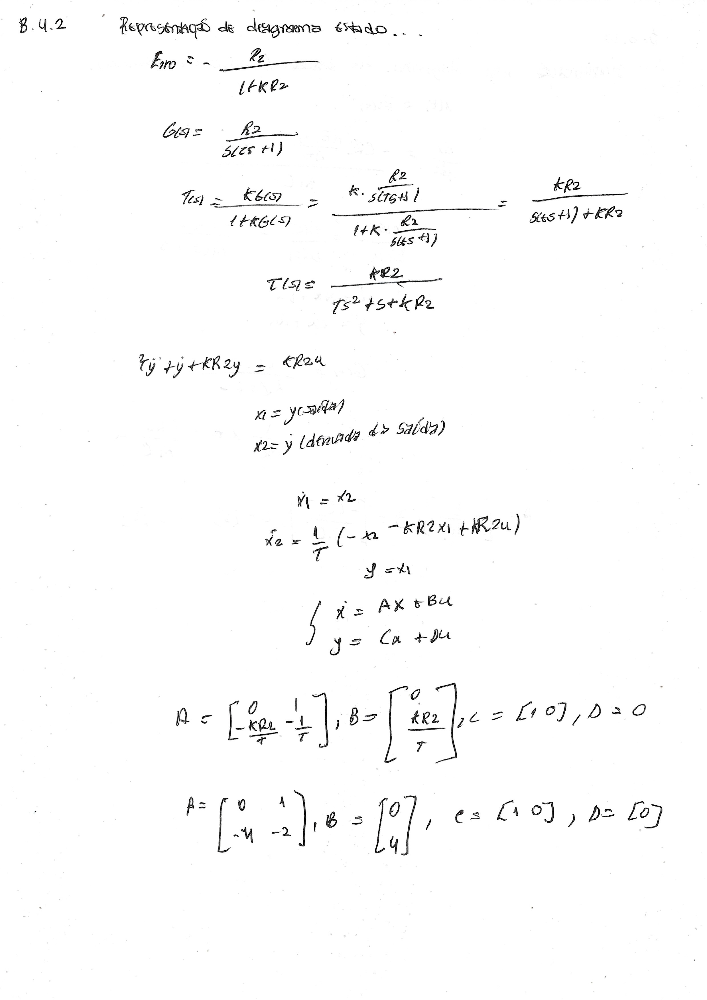


Matriz de Estado (A):
[[ 0.  1.]
 [-4. -2.]]

Matriz de Entrada (B):
[[0.]
 [4.]]

Matriz de Saída (C):
[[1 0]]

Matriz de Transmissão Direta (D):
[[0]]

Função de Transferência:
Numerador: [[0. 0. 4.]]
Denominador: [1. 2. 4.]

Erro final teórico: -0.3333333333333333
Erro final simulado: -2.4293994808077812e-05


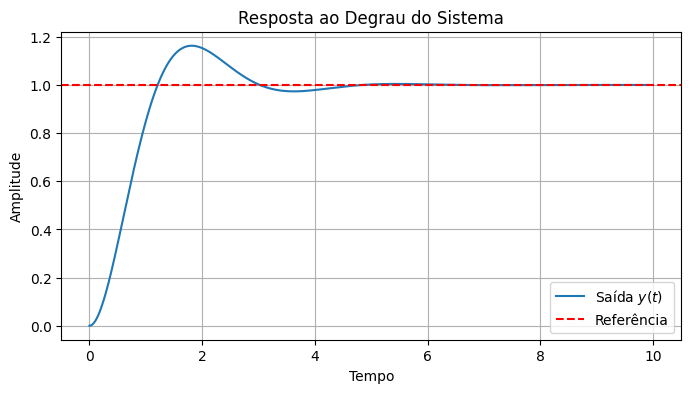

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import ss2tf, step

# Parâmetros do sistema
R2 = 1.0  # Valor de R2
K = 2.0   # Ganho do controlador
tau = 0.5 # Constante de tempo

# Representação matricial do espaço de estados
A = np.array([[0, 1],
              [-K*R2/tau, -1/tau]])
B = np.array([[0],
              [K*R2/tau]])
C = np.array([[1, 0]])
D = np.array([[0]])

# Exibindo as matrizes
print("Matriz de Estado (A):")
print(A)
print("\nMatriz de Entrada (B):")
print(B)
print("\nMatriz de Saída (C):")
print(C)
print("\nMatriz de Transmissão Direta (D):")
print(D)

# Função de transferência a partir do espaço de estados
num, den = ss2tf(A, B, C, D)
print("\nFunção de Transferência:")
print(f"Numerador: {num}")
print(f"Denominador: {den}")

# Cálculo do erro final teórico
error_final = -R2 / (K * R2 + 1)
print(f"\nErro final teórico: {error_final}")

# Resposta ao degrau para verificação
t, y = step((A, B, C, D), T=np.linspace(0, 10, 1000))
steady_state_error = 1 - y[-1]  # Para degrau unitário
print(f"Erro final simulado: {steady_state_error}")

# Plot da resposta ao degrau
plt.figure(figsize=(8, 4))
plt.plot(t, y, label='Saída $y(t)$')
plt.axhline(y=1, color='r', linestyle='--', label='Referência')
plt.xlabel('Tempo')
plt.ylabel('Amplitude')
plt.title('Resposta ao Degrau do Sistema')
plt.legend()
plt.grid(True)
plt.show()

**B.4.12**

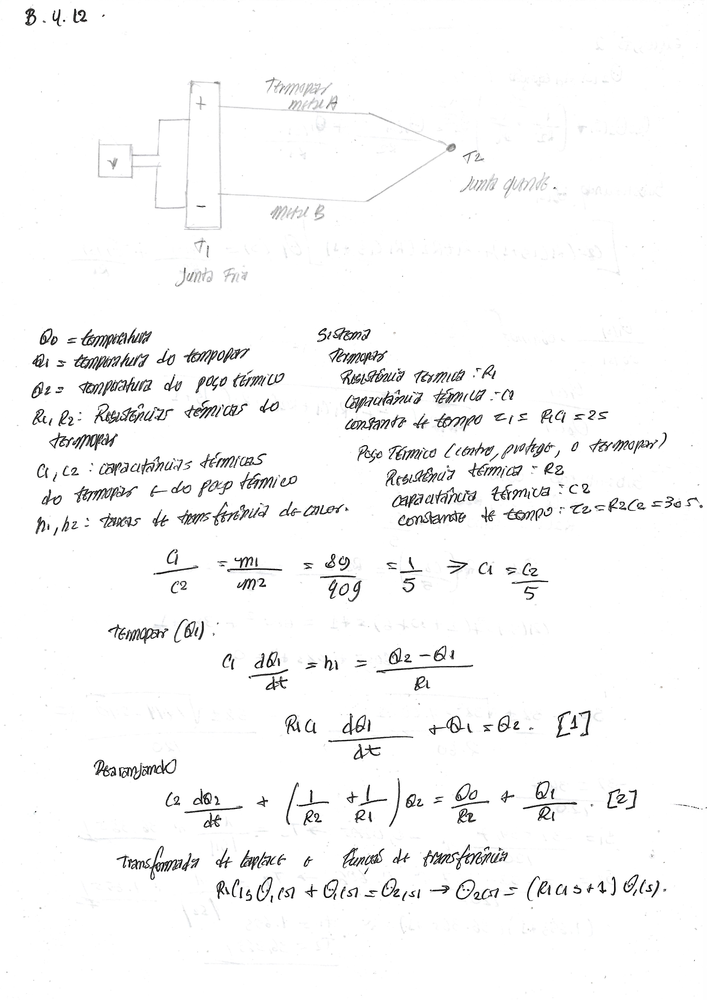

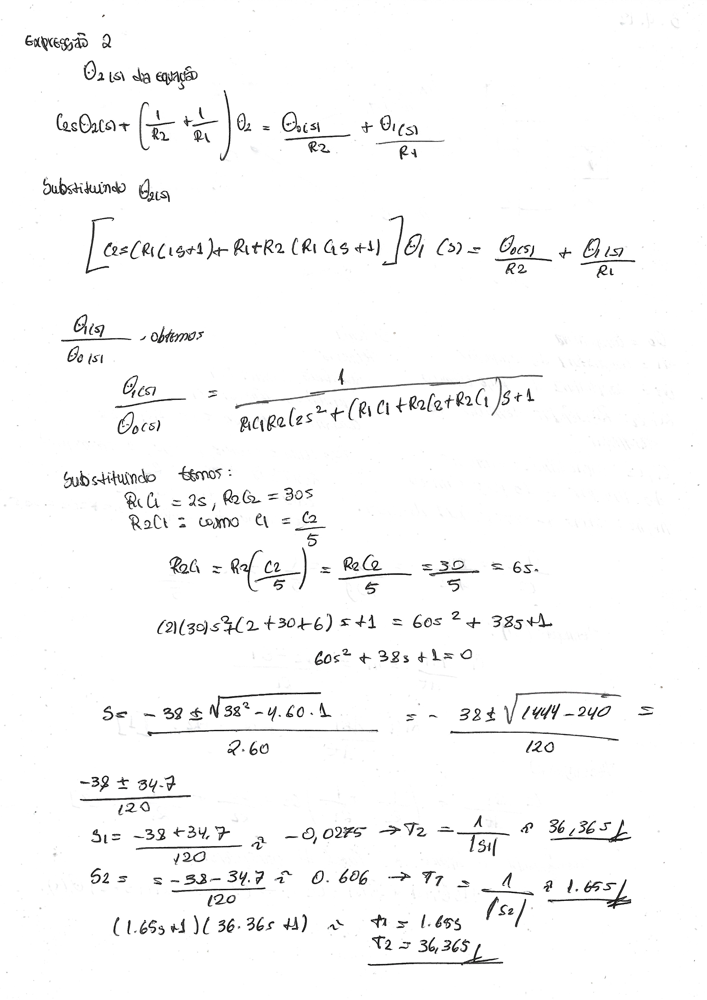

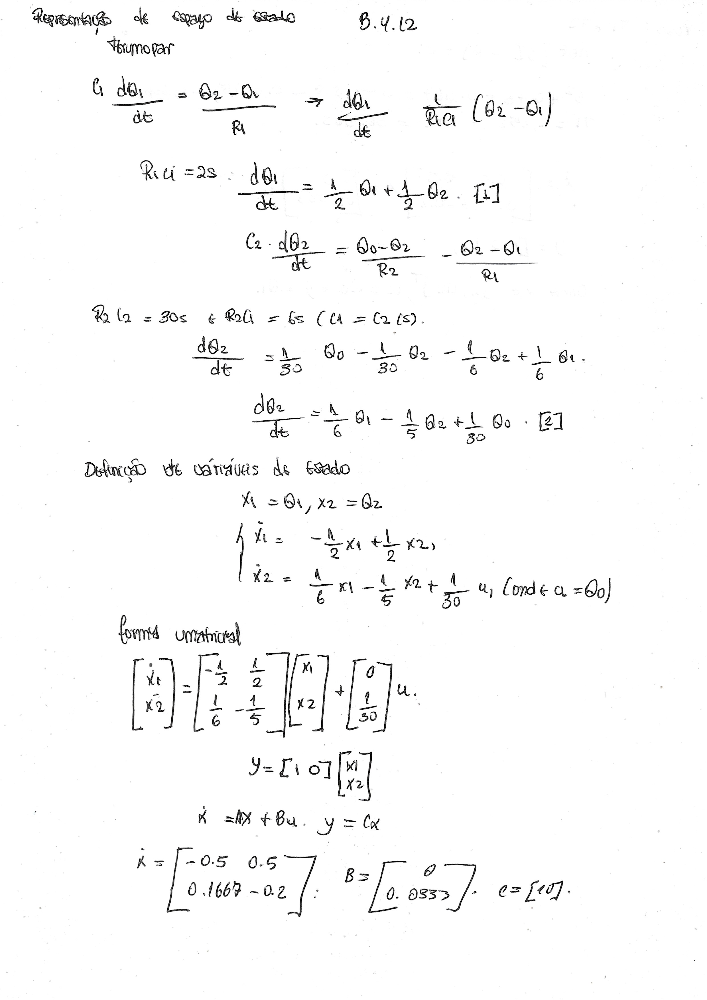

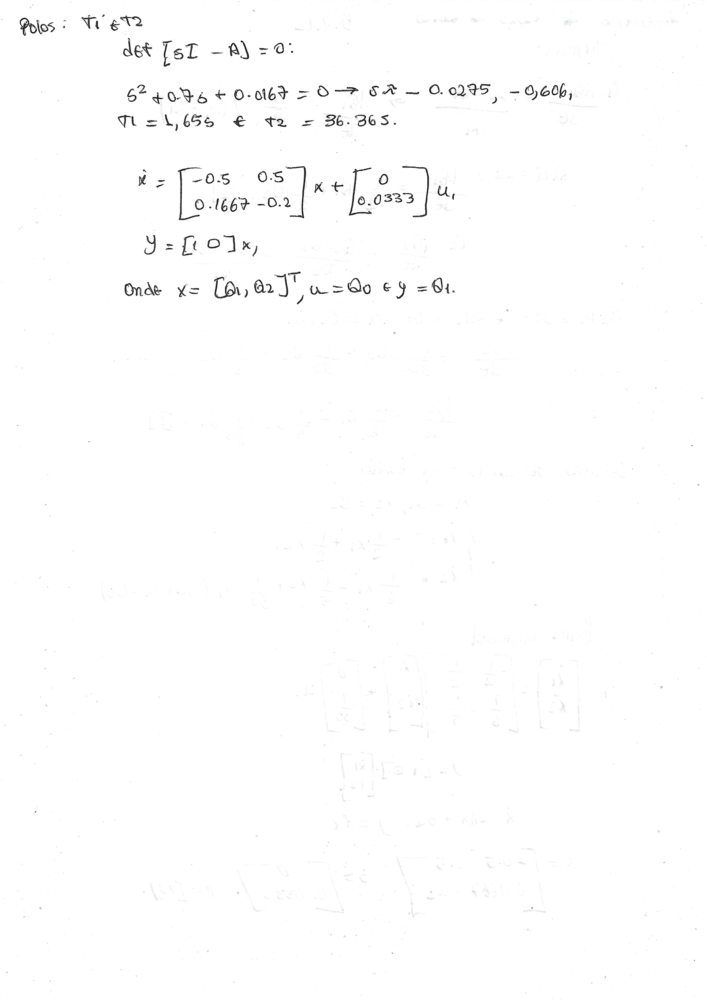

In [ ]:
import numpy as np
from scipy import signal

# Dados do problema
tau1 = 2.0    # Constante de tempo do termopar (R1*C1) em segundos
tau2 = 30.0   # Constante de tempo do poço térmico (R2*C2) em segundos
m1 = 8.0      # Massa do termopar em gramas
m2 = 40.0     # Massa do poço térmico em gramas

# Passo 1: Relação entre capacitâncias térmicas (C) e massas (m)
# Como os calores específicos são iguais, C1/C2 = m1/m2
C1_C2_ratio = m1 / m2
print(f"Passo 1: Razão C1/C2 = m1/m2 = {C1_C2_ratio:.3f}")

# Passo 2: Cálculo de R2*C1
R2C1 = tau2 * C1_C2_ratio
print(f"\nPasso 2: R2*C1 = R2*C2 * (C1/C2) = {tau2} * {C1_C2_ratio:.3f} = {R2C1:.3f} s")

# Passo 3: Equação característica do sistema
# Denominador da função de transferência: R1C1*R2C2*s² + (R1C1 + R2C2 + R2C1)*s + 1
a = tau1 * tau2
b = tau1 + tau2 + R2C1
c = 1

print(f"\nPasso 3: Equação característica:")
print(f"{a:.1f}s² + {b:.1f}s + {c} = 0")

# Passo 4: Resolver a equação quadrática para encontrar as raízes
roots = np.roots([a, b, c])
print(f"\nPasso 4: Raízes da equação característica:")
print(f"s1 = {roots[0]:.4f} 1/s")
print(f"s2 = {roots[1]:.4f} 1/s")

# Passo 5: Calcular as constantes de tempo (T = -1/s para s < 0)
T1 = -1/roots[1]
T2 = -1/roots[0]
print(f"\nPasso 5: Constantes de tempo do sistema:")
print(f"T1 = {T1:.3f} s")
print(f"T2 = {T2:.3f} s")

# Passo 6: Fatoração do polinômio
# Verificação usando a função transferência
num = [1]
den = [a, b, c]
system = signal.TransferFunction(num, den)

# Resultados finais
print("\nResultado Final:")
print(f"As constantes de tempo do sistema combinado são:")
print(f"T1 = {T1:.3f} s (resposta mais rápida - termopar)")
print(f"T2 = {T2:.3f} s (resposta mais lenta - poço térmico)")

# Verificação adicional
print("\nVerificação:")
print("Polos do sistema:", roots)
print("Que correspondem às constantes de tempo T1 e T2 calculadas")

Passo 1: Razão C1/C2 = m1/m2 = 0.200

Passo 2: R2*C1 = R2*C2 * (C1/C2) = 30.0 * 0.200 = 6.000 s

Passo 3: Equação característica:
60.0s² + 38.0s + 1 = 0

Passo 4: Raízes da equação característica:
s1 = -0.6058 1/s
s2 = -0.0275 1/s

Passo 5: Constantes de tempo do sistema:
T1 = 36.349 s
T2 = 1.651 s

Resultado Final:
As constantes de tempo do sistema combinado são:
T1 = 36.349 s (resposta mais rápida - termopar)
T2 = 1.651 s (resposta mais lenta - poço térmico)

Verificação:
Polos do sistema: [-0.60582253 -0.02751081]
Que correspondem às constantes de tempo T1 e T2 calculadas


REPRESENTAÇÃO DE ESPAÇO DE ESTADO

Representação em Espaço de Estados

Matriz A (Dinâmica do Sistema):
[[-0.5         0.5       ]
 [ 0.16666667 -0.2       ]]

Matriz B (Entrada):
[[0.        ]
 [0.03333333]]

Matriz C (Saída):
[[1 0]]

Matriz D (Transmissão Direta):
[[0]]

Análise do Sistema

Polos do Sistema:
[-0.67532035 -0.02467965]

Constantes de Tempo Correspondentes:
[ 1.4807787 40.5192213]


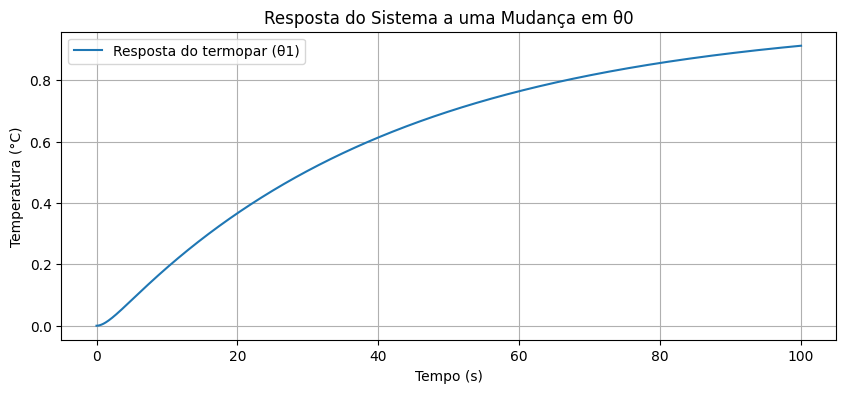

In [ ]:
import numpy as np
from scipy import signal

# Parâmetros do sistema
tau1 = 2.0    # R1*C1 = 2 s
tau2 = 30.0   # R2*C2 = 30 s
m1, m2 = 8.0, 40.0  # Massas (g)
C1_C2 = m1 / m2      # C1/C2 = 0.2
R2C1 = tau2 * C1_C2  # R2*C1 = 6 s

# Matrizes do espaço de estados
A = np.array([
    [-1/tau1, 1/tau1],
    [1/(R2C1), -1/tau2 - 1/R2C1]
])
B = np.array([[0], [1/tau2]])
C = np.array([[1, 0]])  # Saída = θ1
D = np.array([[0]])

# 1. Cálculo dos polos (autovalores de A)
polos = np.linalg.eigvals(A)
constantes_tempo = -1/np.real(polos)

# 2. Saída matricial formatada
print("="*50)
print("Representação em Espaço de Estados")
print("="*50)
print("\nMatriz A (Dinâmica do Sistema):")
print(A)
print("\nMatriz B (Entrada):")
print(B)
print("\nMatriz C (Saída):")
print(C)
print("\nMatriz D (Transmissão Direta):")
print(D)

print("\n" + "="*50)
print("Análise do Sistema")
print("="*50)
print("\nPolos do Sistema:")
print(polos)
print("\nConstantes de Tempo Correspondentes:")
print(constantes_tempo)

# 3. Resposta ao degrau (opcional)
t = np.linspace(0, 100, 1000)
u = np.ones_like(t)  # Entrada degrau θ0 = 1
sys = signal.lti(A, B, C, D)
_, y, _ = signal.lsim(sys, U=u, T=t)

# 4. Plot (opcional)
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 4))
plt.plot(t, y, label='Resposta do termopar (θ1)')
plt.xlabel('Tempo (s)')
plt.ylabel('Temperatura (°C)')
plt.title('Resposta do Sistema a uma Mudança em θ0')
plt.grid(True)
plt.legend()
plt.show()

**ANDRE MOURA LIMA**